# Running SATURN


In [1]:
!pwd

/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/Vignettes/frog_zebrafish_embryogenesis


In [2]:
# Make the csv
import pandas as pd

df = pd.DataFrame(columns=["path", "species", "embedding_path"])
df["species"] = ["human", "mouse"]
df["path"] = ["250213.human.raw.subsampled.fineannot.h5ad", "250212-2.mouse.raw.h5ad"] 

##### CHANGE THESE PATHS #####
human_embedding_path = "/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/protein_embeddings/ESM2/human_embedding.torch"
mouse_embedding_path = "/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/protein_embeddings/ESM2/mouse_embedding.torch"
##############################
df["embedding_path"] = [human_embedding_path, mouse_embedding_path]
df.to_csv("human_mouse_run2-2.csv", index=False)
df

,path,species,embedding_path
0,250213.human.raw.subsampled.fineannot.h5ad,human,/data/User/revolvefire/projects/1.ATAC_230519/...
1,250212-2.mouse.raw.h5ad,mouse,/data/User/revolvefire/projects/1.ATAC_230519/...


# Train the Model

We can see `train-saturn.py`'s potential arguments with `--help`.

In [3]:
!python /data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/train-saturn.py --help

usage: train-saturn.py [-h] [--in_data IN_DATA] [--device DEVICE]
                       [--device_num DEVICE_NUM] [--time_stamp TIME_STAMP] [--org ORG]
                       [--log_dir LOG_DIR] [--work_dir WORK_DIR] [--seed SEED]
                       [--in_label_col IN_LABEL_COL] [--ref_label_col REF_LABEL_COL]
                       [--tissue_subset TISSUE_SUBSET] [--tissue_column TISSUE_COLUMN]
                       [--hv_genes HV_GENES] [--hv_span HV_SPAN]
                       [--num_macrogenes NUM_MACROGENES]
                       [--centroids_init_path CENTROIDS_INIT_PATH]
                       [--embedding_model {ESM1b,MSA1b,protXL,ESM1b_protref,ESM2}]
                       [--centroid_score_func {default,one_hot,smoothed}] [--vae [VAE]]
                       [--hidden_dim HIDDEN_DIM] [--model_dim MODEL_DIM]
                       [--binarize_expression [BINARIZE_EXPRESSION]]
                       [--scale_expression [SCALE_EXPRESSION]] [--pretrain [PRETRAIN]]
       

In [5]:
################################# CHECK IF IN_DATA 
!python ../../train-saturn.py --in_data='human_mouse_run2-2.csv' \
                              --in_label_col='celltype' --ref_label_col='celltype' \
                              --num_macrogenes=2000     --hv_genes=8000          \
                              --centroids_init_path='saturn_results/mh_fineannot_centroids_250215.pkl' \
                              #--score_adata --ct_map_path='celltype_mapping.csv' \
                              --work_dir=. \
                              #--device_num=7 \

Using Device 0
Set seed to 0
Only considering the two last: ['.fineannot', '.h5ad'].
Only considering the two last: ['.fineannot', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].
After loading the anndata human View of AnnData object with n_obs × n_vars = 60000 × 19324
    obs: 'sanger_id', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'index', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'QC', 'S_score', 'G2M_score', 'phase', 'joint_annotation_20220202', 'fig1b_annotation_v2', 'annotation_fine', 'annotation_verybroad', 'annotation_broad', 'celltype', 'species', 'species_

## Load SATURN Results

In [2]:
import scanpy as sc
import pickle

In [3]:
adata = sc.read("./out/saturn_results/test256_data_250213.human.raw.subsampled.fineannot_250212-2.mouse.raw_org_saturn_seed_0.h5ad")
adata

Only considering the two last: ['.raw_org_saturn_seed_0', '.h5ad'].
Only considering the two last: ['.raw_org_saturn_seed_0', '.h5ad'].


AnnData object with n_obs × n_vars = 127558 × 256
    obs: 'labels', 'labels2', 'ref_labels', 'species'
    obsm: 'macrogenes'

In [4]:
adata.obs

,labels,labels2,ref_labels,species
AGCCTAACAGACACTT-1-FCAImmP7803043,human_Pre-dermal condensate,Pre-dermal condensate,Pre-dermal condensate,human
AGTGTCACACGGATAG-1-WS_wEMB13942147,human_Adipocytes,Adipocytes,Adipocytes,human
CAGCTAAAGAGAACAG-1-HCA_rFSKI14539495,human_Schwann/Schwann precursors,Schwann/Schwann precursors,Schwann/Schwann precursors,human
ATTATCCTCACATAGC-1-FCAImmP7528290,human_CD4 T cell,CD4 T cell,CD4 T cell,human
TGTGGTATCCGAACGC-1-HCA_rFSKI14539492,human_LMCD1+ mural cell,LMCD1+ mural cell,LMCD1+ mural cell,human
...,...,...,...,...
TTTGTTGCATGTGCTA-1-9,mouse_BK-1,BK-1,BK-1,mouse
TTTGTTGGTATCATGC-1-9,mouse_DP,DP,DP,mouse
TTTGTTGGTGAAGCTG-1-9,mouse_SBK,SBK,SBK,mouse
TTTGTTGTCAAAGGAT-1-9,mouse_Chond-Fib,Chond-Fib,Chond-Fib,mouse


## Visualize our integration

In [5]:
sc.pp.pca(adata)

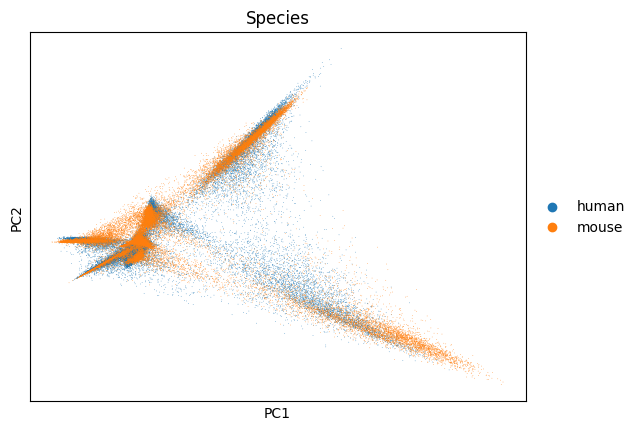

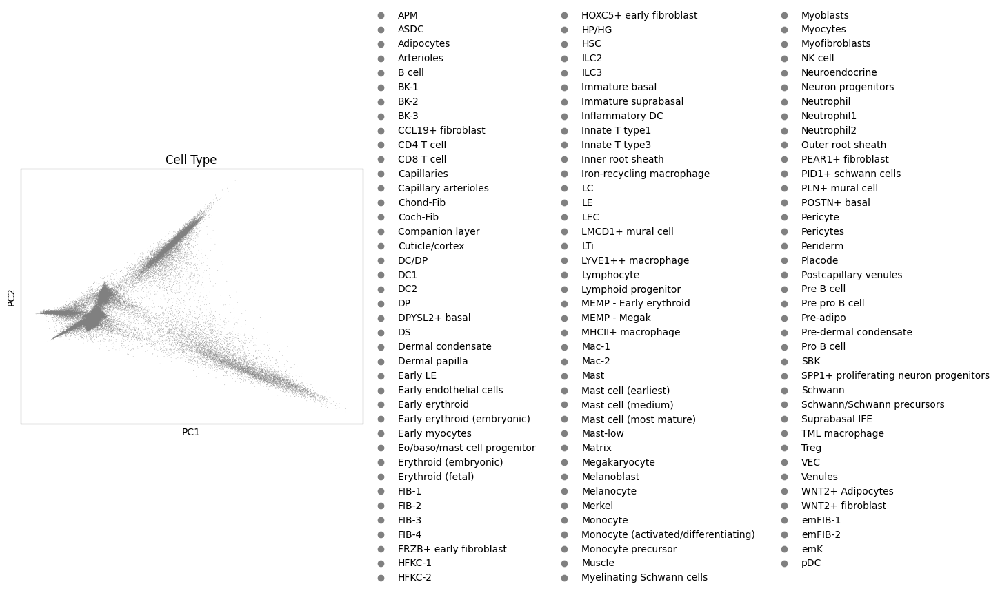

In [6]:
sc.pl.pca(adata, color="species", title="Species")
sc.pl.pca(adata, color="labels2", title="Cell Type") # The original cell type names

In [7]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

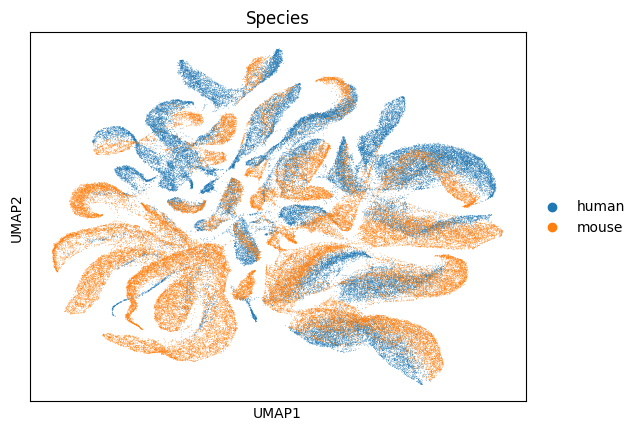

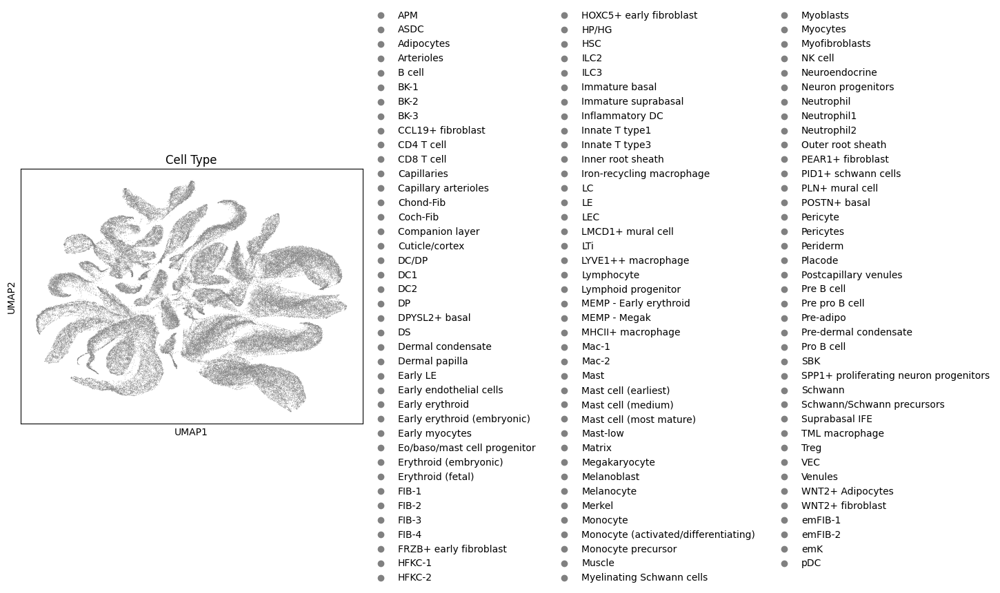

In [8]:
sc.pl.umap(adata, color="species", title="Species")
sc.pl.umap(adata, color="labels2", title="Cell Type")

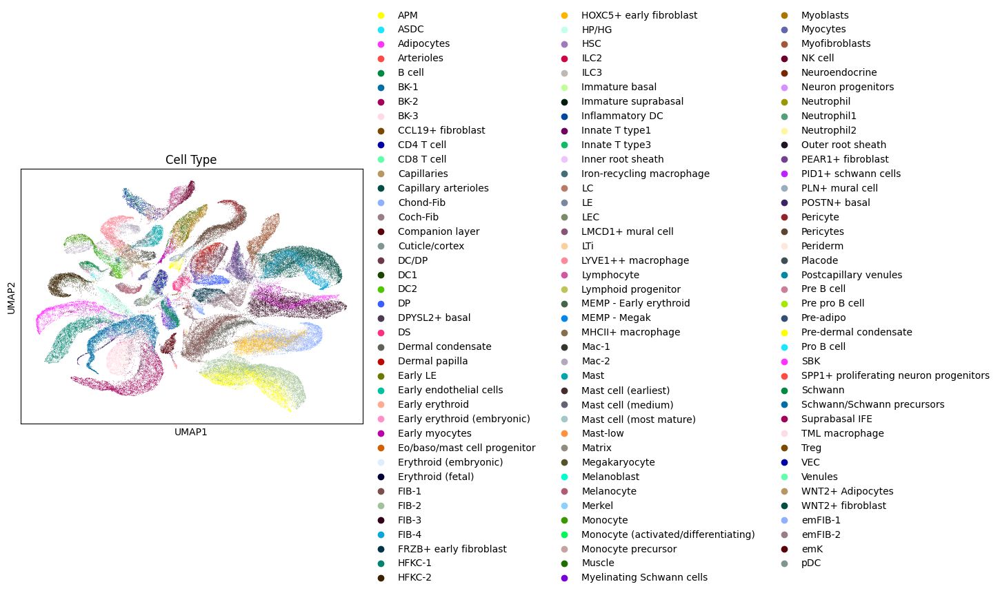

In [22]:
sc.pl.umap(adata, color="labels2", title="Cell Type", palette=sc.pl.palettes.default_102)

In [23]:
adata.obs

,labels,labels2,ref_labels,species,timepoint
AGCCTAACAGACACTT-1-FCAImmP7803043,human_Pre-dermal condensate,Pre-dermal condensate,Pre-dermal condensate,human,15.0
AGTGTCACACGGATAG-1-WS_wEMB13942147,human_Adipocytes,Adipocytes,Adipocytes,human,17.0
CAGCTAAAGAGAACAG-1-HCA_rFSKI14539495,human_Schwann/Schwann precursors,Schwann/Schwann precursors,Schwann/Schwann precursors,human,14.0
ATTATCCTCACATAGC-1-FCAImmP7528290,human_CD4 T cell,CD4 T cell,CD4 T cell,human,13.0
TGTGGTATCCGAACGC-1-HCA_rFSKI14539492,human_LMCD1+ mural cell,LMCD1+ mural cell,LMCD1+ mural cell,human,14.0
...,...,...,...,...,...
TTTGTTGCATGTGCTA-1-9,mouse_BK-1,BK-1,BK-1,mouse,PD4
TTTGTTGGTATCATGC-1-9,mouse_DP,DP,DP,mouse,PD4
TTTGTTGGTGAAGCTG-1-9,mouse_SBK,SBK,SBK,mouse,PD4
TTTGTTGTCAAAGGAT-1-9,mouse_Chond-Fib,Chond-Fib,Chond-Fib,mouse,PD4


In [33]:
mouse = sc.read("250213.mouse.raw.preadipo_to_fibroblast.h5ad") #pre-adipo in fibroblast
human = sc.read("250212.human.raw.h5ad")

Only considering the two last: ['.preadipo_to_fibroblast', '.h5ad'].
Only considering the two last: ['.preadipo_to_fibroblast', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].


In [11]:
sc.set_figure_params(dpi=300)#, facecolor='white')

In [34]:
mouse.obs['celltype']

AAACCTGAGAGACTAT-1-0    Keratinocyte
AAACCTGAGCCAGTAG-1-0      Fibroblast
AAACCTGAGCTATGCT-1-0      Fibroblast
AAACCTGAGGAGTCTG-1-0      Fibroblast
AAACCTGCATGATCCA-1-0    Keratinocyte
                            ...     
TTTGTTGCATGTGCTA-1-9    Keratinocyte
TTTGTTGGTATCATGC-1-9      Fibroblast
TTTGTTGGTGAAGCTG-1-9    Keratinocyte
TTTGTTGTCAAAGGAT-1-9      Fibroblast
TTTGTTGTCCATCGTC-1-9    Keratinocyte
Name: celltype, Length: 67558, dtype: category
Categories (13, object): ['Fibroblast', 'Keratinocyte', 'Lymphatic endothelium', 'Lymphocyte', ..., 'Neutrophil', 'Schwann cell', 'Skeletal muscle', 'Vascular endothelium']

In [111]:
plt.rcParams['axes.grid'] = False
plt.rcParams.update({'xtick.labelsize': 5, 'ytick.labelsize': 7})

sc.pl.correlation_matrix(adata, "labels", figsize=(15, 14),
                           show_correlation_numbers=False,
                           save='250216.fine.correlation_matrix.svg')

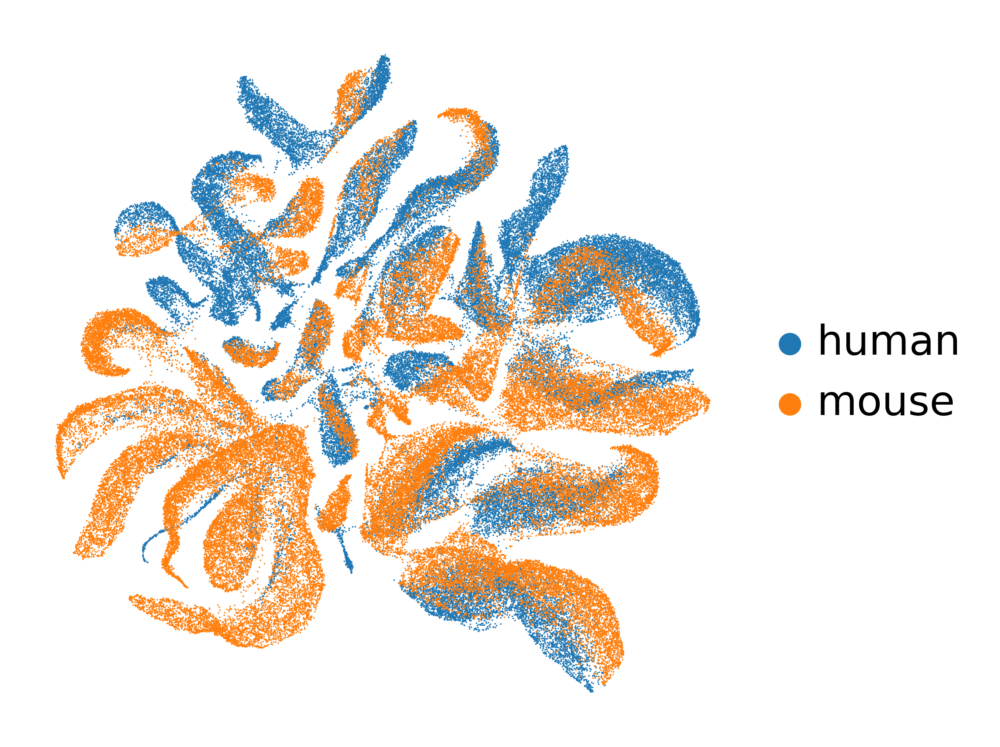

In [208]:
sc.pl.umap(adata, title="", color="species", frameon=False, legend_loc='right margin', save="250216.species.wholeskin.umap.svg")

In [200]:
sc.set_figure_params(dpi=300,  fontsize=14,)#, facecolor='white')

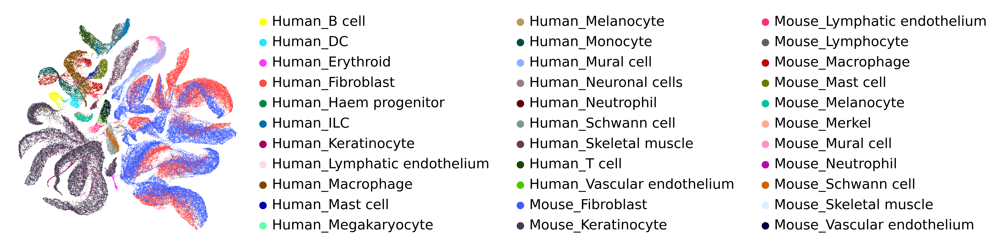

In [209]:
sc.pl.umap(adata, color="broad", title="", palette=sc.pl.palettes.default_102, frameon=False, legend_loc='right margin', save="250216.broad.umap.svg")